## Hacer pruebas:

In [1]:
# import pylidc as pl
# from pylidc.utils import consensus
# import numpy as np
from skimage.measure import find_contours
# import matplotlib.pyplot as plt
# import torch
# import time
# import plotly.graph_objects as go
# import numpy as np
# from mayavi import mlab
# import cv2

In [2]:
from processLIDC import Patient

In [3]:
patient = Patient("LIDC-IDRI-0002")

Loading dicom files ... This may take a moment.


In [4]:
metodos = [m for m in dir(patient) if not '__' in m]
print(metodos) 

['get_all_nodules', 'get_mask', 'get_tensors', 'id_patient', 'imgs_scaled', 'mask', 'plot_mask', 'reconstruct_body', 'scale', 'scan', 'vol']


In [5]:
patient.get_all_nodules()

Paciente: LIDC-IDRI-0002
___________________________________
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 171
num. slices nodulo: 28
-----------
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 176
num. slices nodulo: 23
-----------
___________________________________


In [6]:
patient.plot_mask()

In [7]:
patient.reconstruct_body(nodulos = True)

117265


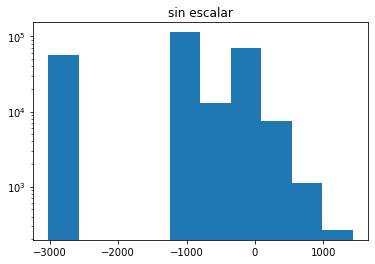

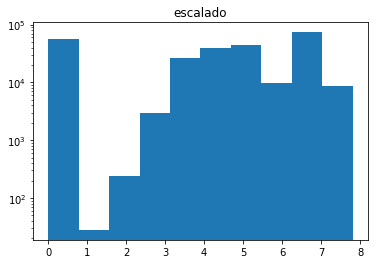

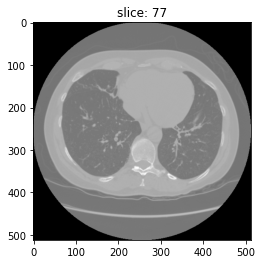

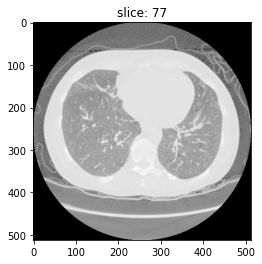

In [8]:
params = {'slices': (77, ), # (180, 185, 190)
          'plot': True,
          'with_mask': False}

patient.scale(**params)

## Inferencia:

In [9]:
# vuelvo a instanciar para liberara la ram:
patient = Patient("LIDC-IDRI-0002")
patient.scale()

Loading dicom files ... This may take a moment.


In [10]:
import torch

1. Descargar el modelo, UNET

In [11]:
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                       in_channels=3, out_channels=1, init_features=32, pretrained=True)

Using cache found in /home/faraujo/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


Inspeccionemos el modelo:

In [12]:
print(model)
print(dir(model))

UNet(
  (encoder1): Sequential(
    (enc1conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu1): ReLU(inplace=True)
    (enc1conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc1norm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc1relu2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (enc2conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (enc2relu1): ReLU(inplace=True)
    (enc2conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (enc2norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

2. Obtener los tensores para pytorch (imagenes)

In [13]:
imgs, mask = patient.get_tensors(scaled=True)

In [14]:
print(imgs.shape)
print(imgs[0].shape)

torch.Size([261, 3, 256, 256])
torch.Size([3, 256, 256])


3. Seleccionar imagenes para hacer inferencia y hacerla:

In [15]:
# slices:
primera = 180
ultima = 184

# Predecir:
pred = model(imgs[primera:ultima])
pred = torch.round(pred).detach().numpy()


Veamos qué ha salido:

In [16]:
import matplotlib.pyplot as plt

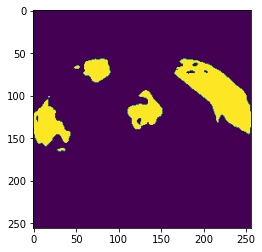

In [17]:
plt.imshow(pred[0].reshape(256,-1))
plt.show()

Es binaria la mascara predicha? Si, aunque preferiria un mapa de calor siendo proximo a 1 donde sea tumor y 0 donde no lo sea.

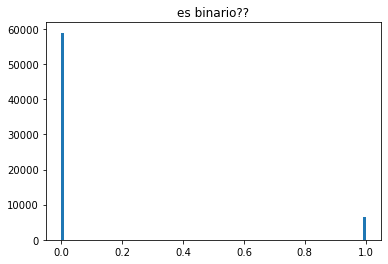

In [18]:
h = pred[0].reshape(-1)
plt.hist(h, bins = 100)
plt.title('es binario??')
plt.show()

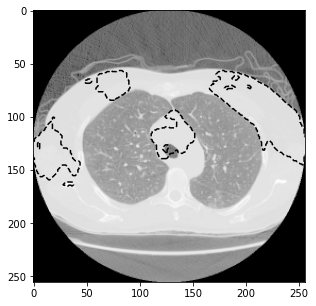

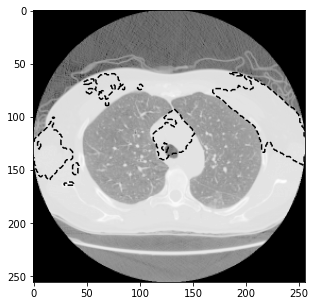

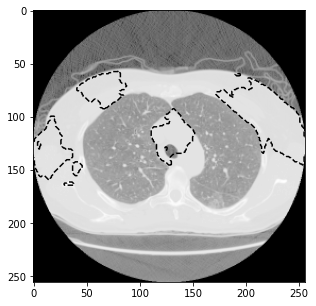

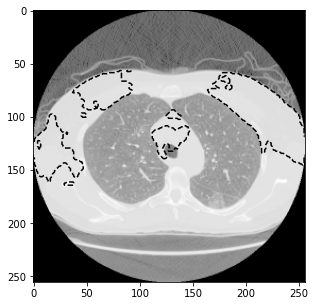

In [19]:
for k in range(ultima-primera):
    
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(imgs[k+primera, 0, :, :], cmap='gray')  # , alpha=0.5)

    for c in find_contours(pred[k, 0, :, :].astype(float), 0.5):
        plt.plot(c[:, 1], c[:, 0], '--k', label='Prediction')
    # plt.savefig(f"slice_pred_{k}.png")
   #  plt.close()

## Entrenar

In [20]:
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader


In [21]:

ll = ['T_destination', '__annotations__', '__call__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_apply', '_backward_hooks', '_block', '_buffers', '_call_impl', '_forward_hooks', '_forward_pre_hooks', '_get_backward_hooks', '_get_name', '_is_full_backward_hook', '_load_from_state_dict', '_load_state_dict_pre_hooks', '_maybe_warn_non_full_backward_hook', '_modules', '_named_members', '_non_persistent_buffers_set', '_parameters', '_register_load_state_dict_pre_hook', '_register_state_dict_hook', '_replicate_for_data_parallel', '_save_to_state_dict', '_slow_forward', '_state_dict_hooks', '_version', 'add_module', 'apply', 'bfloat16', 'bottleneck', 'buffers', 'children', 'conv', 'cpu', 'cuda', 'decoder1', 'decoder2', 'decoder3', 'decoder4', 'double', 'dump_patches', 'encoder1', 'encoder2', 'encoder3', 'encoder4', 'eval', 'extra_repr', 'float', 'forward', 'get_buffer', 'get_extra_state', 'get_parameter', 'get_submodule', 'half', 'load_state_dict', 'modules', 'named_buffers', 'named_children', 'named_modules', 'named_parameters', 'parameters', 'pool1', 'pool2', 'pool3', 'pool4', 'register_backward_hook', 'register_buffer', 'register_forward_hook', 'register_forward_pre_hook', 'register_full_backward_hook', 'register_module', 'register_parameter', 'requires_grad_', 'set_extra_state', 'share_memory', 'state_dict', 'to', 'to_empty', 'train', 'training', 'type', 'upconv1', 'upconv2', 'upconv3', 'upconv4', 'xpu', 'zero_grad']
for l in ll:
    if not '_' == l[0]:
        print(l)

T_destination
add_module
apply
bfloat16
bottleneck
buffers
children
conv
cpu
cuda
decoder1
decoder2
decoder3
decoder4
double
dump_patches
encoder1
encoder2
encoder3
encoder4
eval
extra_repr
float
forward
get_buffer
get_extra_state
get_parameter
get_submodule
half
load_state_dict
modules
named_buffers
named_children
named_modules
named_parameters
parameters
pool1
pool2
pool3
pool4
register_backward_hook
register_buffer
register_forward_hook
register_forward_pre_hook
register_full_backward_hook
register_module
register_parameter
requires_grad_
set_extra_state
share_memory
state_dict
to
to_empty
train
training
type
upconv1
upconv2
upconv3
upconv4
xpu
zero_grad


In [22]:
# for param in model.parameters():
#     print(param)
    # param.requires_grad = False

# for param in model.up_path.parameters():
#     param.requires_grad = True

# for param in model.conv_block.parameters():
#     param.requires_grad = True

# for param in model.final.parameters():
#     param.requires_grad = True

In [23]:
# Definir función de pérdida
loss_fn = nn.BCELoss()

# Definir optimizador
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
n_slices = 10
primera = 185-n_slices
ultima = 185+n_slices
dataset = TensorDataset(imgs[primera:ultima], mask[primera:ultima])

# Lista para almacenar la pérdida de entrenamiento
train_loss_history = []

# Crear el train_loader
batch_size = 4
train_loader = DataLoader(dataset,batch_size=9, shuffle=True)
for epoch in range(20):

    for batch_idx, (data, target) in enumerate(train_loader):
        # print(data.shape, target.shape)
        # # Forward pass
        output = model(data)
        # Calcular pérdida
        # plt.imshow(target[0])
        # plt.show()
        # print(data.shape, target.shape, output.shape)
        loss = loss_fn(output[:,0], target)

        # # # Calcular gradientes y actualizar parámetros
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        train_loss_history.append(loss.item())

        # Imprimir progreso
        if batch_idx % 10 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


Train Epoch: 0 [0/20 (0%)]	Loss: 2.705812
Train Epoch: 1 [0/20 (0%)]	Loss: 0.018918
Train Epoch: 2 [0/20 (0%)]	Loss: 0.012347
Train Epoch: 3 [0/20 (0%)]	Loss: 0.008410
Train Epoch: 4 [0/20 (0%)]	Loss: 0.006343
Train Epoch: 5 [0/20 (0%)]	Loss: 0.006248
Train Epoch: 6 [0/20 (0%)]	Loss: 0.004076
Train Epoch: 7 [0/20 (0%)]	Loss: 0.002931
Train Epoch: 8 [0/20 (0%)]	Loss: 0.003413
Train Epoch: 9 [0/20 (0%)]	Loss: 0.002675
Train Epoch: 10 [0/20 (0%)]	Loss: 0.002430
Train Epoch: 11 [0/20 (0%)]	Loss: 0.001742
Train Epoch: 12 [0/20 (0%)]	Loss: 0.001877
Train Epoch: 13 [0/20 (0%)]	Loss: 0.001683
Train Epoch: 14 [0/20 (0%)]	Loss: 0.001885
Train Epoch: 15 [0/20 (0%)]	Loss: 0.001382
Train Epoch: 16 [0/20 (0%)]	Loss: 0.001620
Train Epoch: 17 [0/20 (0%)]	Loss: 0.001589
Train Epoch: 18 [0/20 (0%)]	Loss: 0.001401
Train Epoch: 19 [0/20 (0%)]	Loss: 0.001399


In [24]:
import numpy as np

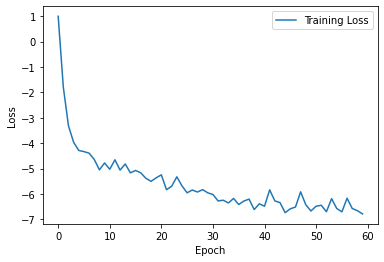

In [25]:
plt.plot(np.log(np.array(train_loss_history)), label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Probemoslo:

In [26]:
imgs, mask = patient.get_tensors(scaled=True)

In [27]:
# slices:
# primera = 164
# ultima = 189

# Predecir:
pred = model(imgs[primera:ultima])
pred = torch.round(pred).detach().numpy()

In [37]:
imgs[primera:ultima].shape

torch.Size([20, 3, 256, 256])

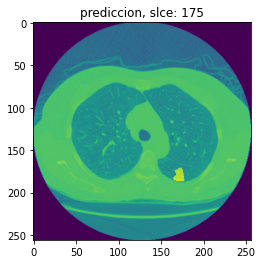

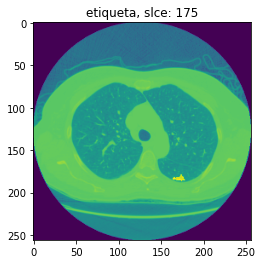

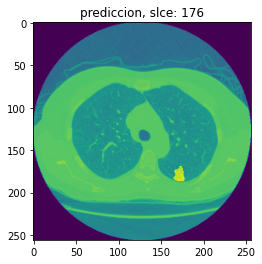

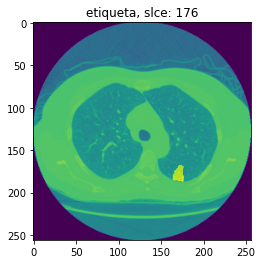

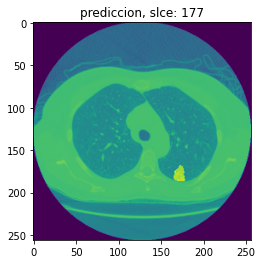

...

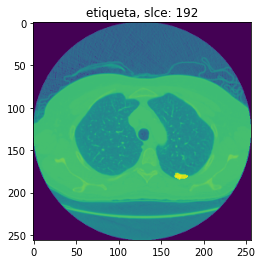

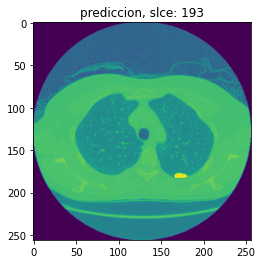

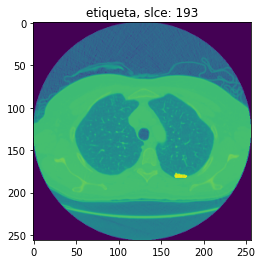

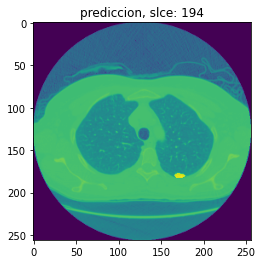

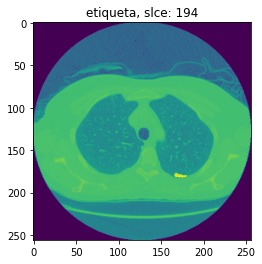

In [39]:
for i in range(20):
    plt.imshow(pred[i].reshape(256,-1)+0.3*np.array(imgs[primera+i, 0]))
    plt.title('prediccion, slce: {}'.format(primera+i))
    plt.show()
    plt.imshow(mask[primera+i]+0.3*np.array(imgs[primera+i, 0]))
    plt.title('etiqueta, slce: {}'.format(primera+i))
    plt.show()